In [2]:
print("ashish")
import torch
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

ashish
cuda


In [11]:
# Add pruning code directory to system path
import sys
sys.path.append('../snip_snyflow_grasp_pruning')
import math
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.nn import init
from torch.nn.parameter import Parameter
from torch.nn.modules.utils import _pair
from Layers import layers



class Linear(nn.Linear):
    def __init__(self, in_features, out_features, bias=True):
        super(Linear, self).__init__(in_features, out_features, bias)        
        self.register_buffer('weight_mask', torch.ones(self.weight.shape))
        if self.bias is not None:
            self.register_buffer('bias_mask', torch.ones(self.bias.shape))

    def forward(self, input):
        W = self.weight_mask * self.weight
        if self.bias is not None:
            b = self.bias_mask * self.bias
        else:
            b = self.bias
        return F.linear(input, W, b)


class Conv2d(nn.Conv2d):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1,
                 bias=True, padding_mode='zeros'):
        super(Conv2d, self).__init__(
            in_channels, out_channels, kernel_size, stride, padding, 
            dilation, groups, bias, padding_mode)
        self.register_buffer('weight_mask', torch.ones(self.weight.shape))
        if self.bias is not None:
            self.register_buffer('bias_mask', torch.ones(self.bias.shape))

    def _conv_forward(self, input, weight, bias):
        if self.padding_mode != 'zeros':
            return F.conv2d(F.pad(input, self._padding_repeated_twice, mode=self.padding_mode),
                            weight, bias, self.stride,
                            _pair(0), self.dilation, self.groups)
        return F.conv2d(input, weight, bias, self.stride,
                        self.padding, self.dilation, self.groups)

    def forward(self, input):
        W = self.weight_mask * self.weight
        if self.bias is not None:
            b = self.bias_mask * self.bias
        else:
            b = self.bias
        return self._conv_forward(input, W, b)


class BatchNorm1d(nn.BatchNorm1d):
    def __init__(self, num_features, eps=1e-5, momentum=0.1, affine=True,
                 track_running_stats=True):
        super(BatchNorm1d, self).__init__(
            num_features, eps, momentum, affine, track_running_stats)
        if self.affine:     
            self.register_buffer('weight_mask', torch.ones(self.weight.shape))
            self.register_buffer('bias_mask', torch.ones(self.bias.shape))

    def forward(self, input):
        self._check_input_dim(input)

        # exponential_average_factor is set to self.momentum
        # (when it is available) only so that if gets updated
        # in ONNX graph when this node is exported to ONNX.
        if self.momentum is None:
            exponential_average_factor = 0.0
        else:
            exponential_average_factor = self.momentum

        if self.training and self.track_running_stats:
            # TODO: if statement only here to tell the jit to skip emitting this when it is None
            if self.num_batches_tracked is not None:
                self.num_batches_tracked = self.num_batches_tracked + 1
                if self.momentum is None:  # use cumulative moving average
                    exponential_average_factor = 1.0 / float(self.num_batches_tracked)
                else:  # use exponential moving average
                    exponential_average_factor = self.momentum
        if self.affine:
            W = self.weight_mask * self.weight
            b = self.bias_mask * self.bias
        else:
            W = self.weight
            b = self.bias

        return F.batch_norm(
            input, self.running_mean, self.running_var, W, b,
            self.training or not self.track_running_stats,
            exponential_average_factor, self.eps)


class BatchNorm2d(nn.BatchNorm2d):
    def __init__(self, num_features, eps=1e-5, momentum=0.1, affine=True,
                 track_running_stats=True):
        super(BatchNorm2d, self).__init__(
            num_features, eps, momentum, affine, track_running_stats)
        if self.affine:     
            self.register_buffer('weight_mask', torch.ones(self.weight.shape))
            self.register_buffer('bias_mask', torch.ones(self.bias.shape))

    def forward(self, input):
        self._check_input_dim(input)

        # exponential_average_factor is set to self.momentum
        # (when it is available) only so that if gets updated
        # in ONNX graph when this node is exported to ONNX.
        if self.momentum is None:
            exponential_average_factor = 0.0
        else:
            exponential_average_factor = self.momentum

        if self.training and self.track_running_stats:
            # TODO: if statement only here to tell the jit to skip emitting this when it is None
            if self.num_batches_tracked is not None:
                self.num_batches_tracked = self.num_batches_tracked + 1
                if self.momentum is None:  # use cumulative moving average
                    exponential_average_factor = 1.0 / float(self.num_batches_tracked)
                else:  # use exponential moving average
                    exponential_average_factor = self.momentum
        if self.affine:
            W = self.weight_mask * self.weight
            b = self.bias_mask * self.bias
        else:
            W = self.weight
            b = self.bias

        return F.batch_norm(
            input, self.running_mean, self.running_var, W, b,
            self.training or not self.track_running_stats,
            exponential_average_factor, self.eps)


class Identity1d(nn.Module):
    def __init__(self, num_features):
        super(Identity1d, self).__init__()
        self.num_features = num_features
        self.weight = Parameter(torch.Tensor(num_features))
        self.register_buffer('weight_mask', torch.ones(self.weight.shape))
        self.reset_parameters()

    def reset_parameters(self):
        init.ones_(self.weight)

    def forward(self, input):
        W = self.weight_mask * self.weight
        return input * W


class Identity2d(nn.Module):
    def __init__(self, num_features):
        super(Identity2d, self).__init__()
        self.num_features = num_features
        self.weight = Parameter(torch.Tensor(num_features, 1, 1))
        self.register_buffer('weight_mask', torch.ones(self.weight.shape))
        self.reset_parameters()

    def reset_parameters(self):
        init.ones_(self.weight)

    def forward(self, input):
        W = self.weight_mask * self.weight
        return input * W





# Resnet Model

In [12]:
import torch.nn as nn
import torch.nn.functional as F
from Layers import layers
import torch


class Block(nn.Module):
    """A ResNet block."""

    def __init__(self, f_in: int, f_out: int, downsample=False):
        super(Block, self).__init__()

        stride = 2 if downsample else 1
        self.conv1 = layers.Conv2d(f_in, f_out, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = layers.BatchNorm2d(f_out)
        self.conv2 = layers.Conv2d(f_out, f_out, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = layers.BatchNorm2d(f_out)

        # No parameters for shortcut connections.
        if downsample or f_in != f_out:
            self.shortcut = nn.Sequential(
                layers.Conv2d(f_in, f_out, kernel_size=1, stride=2, bias=False),
                layers.BatchNorm2d(f_out)
            )
        else:
            self.shortcut = layers.Identity2d(f_in)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        return F.relu(out)


class ResNet(nn.Module):
    """A residual neural network as originally designed for CIFAR-10."""
    
    def __init__(self, plan, num_classes, dense_classifier):
        super(ResNet, self).__init__()

        # Initial convolution.
        current_filters = plan[0][0]
        self.conv = layers.Conv2d(3, current_filters, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn = layers.BatchNorm2d(current_filters)

        # The subsequent blocks of the ResNet.
        blocks = []
        for segment_index, (filters, num_blocks) in enumerate(plan):
            for block_index in range(num_blocks):
                downsample = segment_index > 0 and block_index == 0
                blocks.append(Block(current_filters, filters, downsample))
                current_filters = filters

        self.blocks = nn.Sequential(*blocks)

        self.fc = layers.Linear(plan[-1][0], num_classes)
        if dense_classifier:
            self.fc = nn.Linear(plan[-1][0], num_classes)

        self._initialize_weights()


    def forward(self, x):
        out = F.relu(self.bn(self.conv(x)))
        out = self.blocks(out)
        out = F.avg_pool2d(out, out.size()[3])
        out = out.view(out.size(0), -1)
        out = self.fc(out)
        return out

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, (layers.Linear, nn.Linear, layers.Conv2d)):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, layers.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)


def _plan(D, W):
    """The naming scheme for a ResNet is 'cifar_resnet_N[_W]'.

    The ResNet is structured as an initial convolutional layer followed by three "segments"
    and a linear output layer. Each segment consists of D blocks. Each block is two
    convolutional layers surrounded by a residual connection. Each layer in the first segment
    has W filters, each layer in the second segment has 32W filters, and each layer in the
    third segment has 64W filters.

    The name of a ResNet is 'cifar_resnet_N[_W]', where W is as described above.
    N is the total number of layers in the network: 2 + 6D.
    The default value of W is 16 if it isn't provided.

    For example, ResNet-20 has 20 layers. Exclusing the first convolutional layer and the final
    linear layer, there are 18 convolutional layers in the blocks. That means there are nine
    blocks, meaning there are three blocks per segment. Hence, D = 3.
    The name of the network would be 'cifar_resnet_20' or 'cifar_resnet_20_16'.
    """
    if (D - 2) % 3 != 0:
        raise ValueError('Invalid ResNet depth: {}'.format(D))
    D = (D - 2) // 6
    plan = [(W, D), (2*W, D), (4*W, D)]

    return plan

def _resnet(arch, plan, num_classes, dense_classifier, pretrained):
    model = ResNet(plan, num_classes, dense_classifier)
    if pretrained:
        pretrained_path = 'Models/pretrained/{}-lottery.pt'.format(arch)
        pretrained_dict = torch.load(pretrained_path)
        model_dict = model.state_dict()
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict)
    return model


# ResNet Models
def resnet20(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(20, 16)
    return _resnet('resnet20', plan, num_classes, dense_classifier, pretrained)

def resnet32(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(32, 16)
    return _resnet('resnet32', plan, num_classes, dense_classifier, pretrained)

def resnet44(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(44, 16)
    return _resnet('resnet44', plan, num_classes, dense_classifier, pretrained)

def resnet56(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(56, 16)
    return _resnet('resnet56', plan, num_classes, dense_classifier, pretrained)

def resnet110(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(110, 16)
    return _resnet('resnet110', plan, num_classes, dense_classifier, pretrained)

def resnet1202(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(1202, 16)
    return _resnet('resnet1202', plan, num_classes, dense_classifier, pretrained)

# Wide ResNet Models
def wide_resnet20(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(20, 32)
    return _resnet('wide_resnet20', plan, num_classes, dense_classifier, pretrained)

def wide_resnet32(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(32, 32)
    return _resnet('wide_resnet32', plan, num_classes, dense_classifier, pretrained)

def wide_resnet44(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(44, 32)
    return _resnet('wide_resnet44', plan, num_classes, dense_classifier, pretrained)

def wide_resnet56(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(56, 32)
    return _resnet('wide_resnet56', plan, num_classes, dense_classifier, pretrained)

def wide_resnet110(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(110, 32)
    return _resnet('wide_resnet110', plan, num_classes, dense_classifier, pretrained)

def wide_resnet1202(input_shape, num_classes, dense_classifier=False, pretrained=False):
    plan = _plan(1202, 32)
    return _resnet('wide_resnet1202', plan, num_classes, dense_classifier, pretrained)


Files already downloaded and verified
Files already downloaded and verified


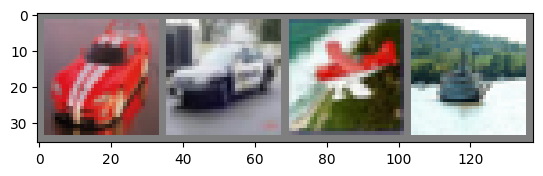

car   car   plane ship 


In [13]:
# Import necessary libraries
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Download and transform CIFAR-10 dataset
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='../Data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='../Data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# Function to show an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# Show images
imshow(torchvision.utils.make_grid(images))
# Print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))


In [17]:
# Instantiate the VGG model
net = resnet32((3, 32, 32), 10).to(device)
print(net)


# Function to test the model
def test_model(net, testloader, return_accuracy=False):
    net.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    if return_accuracy:
        return accuracy
    print(f'Accuracy of the network on the 10000 test images: {accuracy:.2f}%')



ResNet(
  (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (blocks): Sequential(
    (0): Block(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Identity2d()
    )
    (1): Block(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_

# Let's Train the Model with Compression Using synflow algorithm

In [1]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model resnet32 \
  --pruner our_algo \s
  --compression 0.6 \
  --gpu 1 \
  --output_dir resnet32_our_algo_0.6C \
  --epochs 160


Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-resnet32 model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with our_algo for 3 epochs.
  0%|                                                     | 0/3 [00:00<?, ?it/s]0.7368062997280773
sparsity value
Epoch 1/3, Sparsity: 342197.0/464432 (0.7368)
 33%|███████████████                              | 1/3 [00:00<00:01,  1.96it/s]0.5428835233189814
sparsity value
Epoch 2/3, Sparsity: 252133.0/464432 (0.5429)
 67%|██████████████████████████████               | 2/3 [00:01<00:00,  1.93it/s]0.4
sparsity value
Epoch 3/3, Sparsity: 185773.0/464432 (0.4000)
100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  2.02it/s]
ashish
185773.0 prunable parameters remaining, expected 185772.80000000002
Post-Training for 160 epochs.
  0%|                                                   | 0/160 [00:00<?, ?it/s]Figure(1200x800)
N

In [2]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model resnet32 \
  --pruner our_algo \
  --compression 0.9 \
  --gpu 1 \
  --output_dir resnet32_our_algo_0.9C \
  --epochs 160

Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-resnet32 model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with our_algo for 3 epochs.
  0%|                                                     | 0/3 [00:00<?, ?it/s]0.46415888336127786
sparsity value
Epoch 1/3, Sparsity: 215571.0/464432 (0.4642)
 33%|███████████████                              | 1/3 [00:00<00:00,  2.37it/s]0.21544346900318836
sparsity value
Epoch 2/3, Sparsity: 100059.0/464432 (0.2154)
 67%|██████████████████████████████               | 2/3 [00:00<00:00,  2.47it/s]0.09999999999999998
sparsity value
Epoch 3/3, Sparsity: 46444.0/464432 (0.1000)
100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  2.46it/s]
ashish
46444.0 prunable parameters remaining, expected 46443.19999999999
Post-Training for 160 epochs.
  0%|                                                   | 0/160 [00:00<?, ?it/s]Fig

In [3]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model vgg16-bn \
  --pruner our_algo \
  --compression 0.6 \
  --prune-bias True \
  --prune-batchnorm True \
  --prune-residual True \
  --reinitialize True \
  --gpu 1 \
  --output_dir vgg16-bn_our_algo_0.6C \
  --epochs 160


Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-vgg16-bn model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with our_algo for 3 epochs.
  0%|                                                     | 0/3 [00:00<?, ?it/s]0.7368062997280773
sparsity value
Epoch 1/3, Sparsity: 10851879.0/14728266 (0.7368)
 33%|███████████████                              | 1/3 [00:00<00:01,  1.81it/s]0.5428835233189814
sparsity value
Epoch 2/3, Sparsity: 7995732.0/14728266 (0.5429)
 67%|██████████████████████████████               | 2/3 [00:01<00:00,  1.85it/s]0.4
sparsity value
Epoch 3/3, Sparsity: 5891307.0/14728266 (0.4000)
100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  1.86it/s]
ashish
5891307.0 prunable parameters remaining, expected 5891306.4
Post-Training for 160 epochs.
  0%|                                                   | 0/160 [00:00<?, ?it/s]Figure(1200x800)

In [4]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model vgg16-bn \
  --pruner our_algo \
  --compression 0.9 \
  --prune-bias True \
  --prune-batchnorm True \
  --prune-residual True \
  --reinitialize True \
  --gpu 1 \
  --output_dir vgg16-bn_our_algo_0.9C \
  --epochs 160

Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-vgg16-bn model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with our_algo for 3 epochs.
  0%|                                                     | 0/3 [00:00<?, ?it/s]0.46415888336127786
sparsity value
Epoch 1/3, Sparsity: 6836255.0/14728266 (0.4642)
 33%|███████████████                              | 1/3 [00:00<00:01,  1.82it/s]0.21544346900318836
sparsity value
Epoch 2/3, Sparsity: 3173109.0/14728266 (0.2154)
 67%|██████████████████████████████               | 2/3 [00:01<00:00,  1.84it/s]0.09999999999999998
sparsity value
Epoch 3/3, Sparsity: 1472827.0/14728266 (0.1000)
100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  1.83it/s]
ashish
1472827.0 prunable parameters remaining, expected 1472826.5999999996
Post-Training for 160 epochs.
  0%|                                                   | 0/160 [00:00

# Let's Train the Model Without Compression

In [11]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model resnet32 \
  --pruner synflow \
  --compression 0.5 \
  --gpu 0 \
  --expid resnet32_0C \
  --epochs 10

Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-resnet32 model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with synflow for 1 epochs.
  0%|                                                     | 0/1 [00:00<?, ?it/s]0.31622776601683794
sparsity value
Epoch 1/1, Sparsity: 146867.0/464432 (0.3162)
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.76it/s]
ashish
146867.0 prunable parameters remaining, expected 146866.2938267321
Post-Training for 10 epochs.
  0%|                                                    | 0/10 [00:00<?, ?it/s]Figure(1200x800)
New best model saved with accuracy: 41.51%
 10%|████▍                                       | 1/10 [00:09<01:23,  9.26s/it]Figure(1200x800)
New best model saved with accuracy: 51.86%
 20%|████████▊                                   | 2/10 [00:18<01:13,  9.16s/it]Figure(1200x800)
New best model saved with ac

In [12]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model resnet32 \
  --pruner snip \
  --compression 0.5 \
  --gpu 0 \
  --expid resnet32_0C \
  --epochs 10

Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-resnet32 model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with snip for 1 epochs.
  0%|                                                     | 0/1 [00:00<?, ?it/s]0.31622776601683794
sparsity value
Epoch 1/1, Sparsity: 146867.0/464432 (0.3162)
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]
ashish
146867.0 prunable parameters remaining, expected 146866.2938267321
Post-Training for 10 epochs.
  0%|                                                    | 0/10 [00:00<?, ?it/s]Figure(1200x800)
New best model saved with accuracy: 41.61%
 10%|████▍                                       | 1/10 [00:09<01:22,  9.13s/it]Figure(1200x800)
New best model saved with accuracy: 51.31%
 20%|████████▊                                   | 2/10 [00:18<01:13,  9.13s/it]Figure(1200x800)
New best model saved with accur

In [13]:
!python ../snip_snyflow_grasp_pruning/main.py \
  --dataset cifar10 \
  --model resnet32 \
  --pruner grasp \
  --compression 0.5 \
  --gpu 0 \
  --expid resnet32_0C \
  --epochs 10

Loading cifar10 dataset.
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Creating lottery-resnet32 model.
Pre-Train for 0 epochs.
0it [00:00, ?it/s]
Pruning with grasp for 1 epochs.
  0%|                                                     | 0/1 [00:00<?, ?it/s]0.31622776601683794
sparsity value
Epoch 1/1, Sparsity: 146867.0/464432 (0.3162)
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]
ashish
146867.0 prunable parameters remaining, expected 146866.2938267321
Post-Training for 10 epochs.
  0%|                                                    | 0/10 [00:00<?, ?it/s]Figure(1200x800)
New best model saved with accuracy: 17.31%
 10%|████▍                                       | 1/10 [00:09<01:26,  9.63s/it]Figure(1200x800)
New best model saved with accuracy: 23.50%
 20%|████████▊                                   | 2/10 [00:18<01:14,  9.27s/it]Figure(1200x800)
New best model saved with accu

Accuracy of the network on the 10000 test images: 43.02%


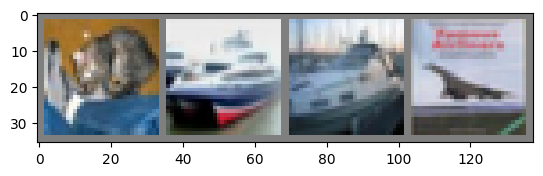

Predicted:  cat   ship  ship  ship 
GroundTruth:  cat   ship  ship  plane


In [19]:
# Load the saved model
net = resnet32((3, 32, 32), 10).to(device)
#print(net)
net.load_state_dict(torch.load('resnet32_0C/best_model.pth'))

# Test the network on the test data
test_model(net, testloader)

# Visualize some test images along with predicted and true labels
dataiter = iter(testloader)
images, labels = dataiter.next()
images, labels = images.to(device), labels.to(device)

def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

outputs = net(images)
_, predicted = torch.max(outputs, 1)

# Display images
imshow(torchvision.utils.make_grid(images.cpu()))
print('Predicted: ', ' '.join(f'{classes[predicted[j]]:5s}' for j in range(4)))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))

In [20]:

# Load the saved model
pruned_model = resnet32((3, 32, 32), 10).to(device)
#print(net)
pruned_model.load_state_dict(torch.load('resnet32_0.5C/best_model.pth'))

# Test the network on the test data
test_model(pruned_model, testloader)

Accuracy of the network on the 10000 test images: 34.52%


In [21]:
# Load the saved model
original_model = resnet32((3, 32, 32), 10).to(device)
#print(net)
original_model.load_state_dict(torch.load('resnet32_0C/best_model.pth'))

# Test the network on the test data
test_model(original_model, testloader)

Accuracy of the network on the 10000 test images: 43.02%


In [26]:
import torch

def get_masks(module):
    """Returns an iterator over module masks, yielding the mask."""
    if hasattr(module, 'weight_mask'):
        yield module.weight_mask
    if hasattr(module, 'bias_mask'):
        yield module.bias_mask

def apply_masks(model):
    """Applies the mask to the parameters."""
    for module in model.modules():
        if hasattr(module, 'weight_mask'):
            module.weight.data.mul_(module.weight_mask)
        if hasattr(module, 'bias_mask'):
            module.bias.data.mul_(module.bias_mask)

def calculate_sparsity(model):
    sparsity_dict = {}
    total_params = 0
    sparse_params = 0
    
    for name, module in model.named_modules():
        module_total_params = 0
        module_sparse_params = 0
        has_param = False
        for pname, param in module.named_parameters(recurse=False):
            if param.requires_grad:
                param_total = param.numel()
                param_sparse = (param == 0).sum().item()
                
                module_total_params += param_total
                module_sparse_params += param_sparse
                total_params += param_total
                sparse_params += param_sparse
                has_param = True
                
        if has_param:  # Only include modules with parameters
            if module_total_params > 0:
                module_sparsity = module_sparse_params / module_total_params
            else:
                module_sparsity = 0
            sparsity_dict[name] = module_sparsity
    
    overall_sparsity = sparse_params / total_params
    return sparsity_dict, total_params, sparse_params, overall_sparsity

def print_sparsity(sparsity_dict, total_params, sparse_params, overall_sparsity):
    for module_name, sparsity in sparsity_dict.items():
        print(f"Module: {module_name}, Sparsity: {sparsity:.4f}")
    print(f"Total Trainable Parameters: {total_params}")
    print(f"Sparse Parameters: {sparse_params}")
    print(f"Overall Sparsity: {overall_sparsity:.4f}")
    print(f"Percentage of Pruned Parameters: {overall_sparsity * 100:.2f}%")


In [27]:
apply_masks(pruned_model)

In [28]:
# Calculate and print the sparsity
sparsity_dict, total_params, sparse_params, overall_sparsity = calculate_sparsity(pruned_model)
print_sparsity(sparsity_dict, total_params, sparse_params, overall_sparsity)

Module: conv, Sparsity: 0.0116
Module: bn, Sparsity: 0.0000
Module: blocks.0.conv1, Sparsity: 0.0812
Module: blocks.0.bn1, Sparsity: 0.0000
Module: blocks.0.conv2, Sparsity: 0.0664
Module: blocks.0.bn2, Sparsity: 0.0000
Module: blocks.0.shortcut, Sparsity: 0.0000
Module: blocks.1.conv1, Sparsity: 0.0751
Module: blocks.1.bn1, Sparsity: 0.0000
Module: blocks.1.conv2, Sparsity: 0.0794
Module: blocks.1.bn2, Sparsity: 0.0000
Module: blocks.1.shortcut, Sparsity: 0.0000
Module: blocks.2.conv1, Sparsity: 0.0642
Module: blocks.2.bn1, Sparsity: 0.0000
Module: blocks.2.conv2, Sparsity: 0.0768
Module: blocks.2.bn2, Sparsity: 0.0000
Module: blocks.2.shortcut, Sparsity: 0.0000
Module: blocks.3.conv1, Sparsity: 0.0760
Module: blocks.3.bn1, Sparsity: 0.0000
Module: blocks.3.conv2, Sparsity: 0.0625
Module: blocks.3.bn2, Sparsity: 0.0000
Module: blocks.3.shortcut, Sparsity: 0.0000
Module: blocks.4.conv1, Sparsity: 0.0720
Module: blocks.4.bn1, Sparsity: 0.0000
Module: blocks.4.conv2, Sparsity: 0.0734
Mod

# 1. Weight Distribution Histograms

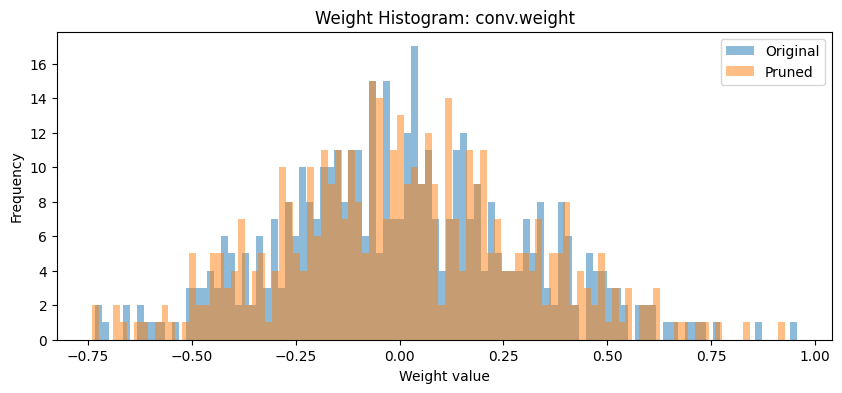

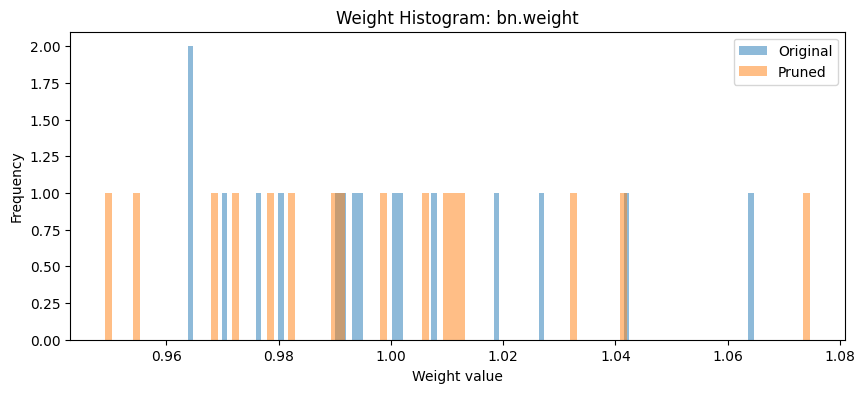

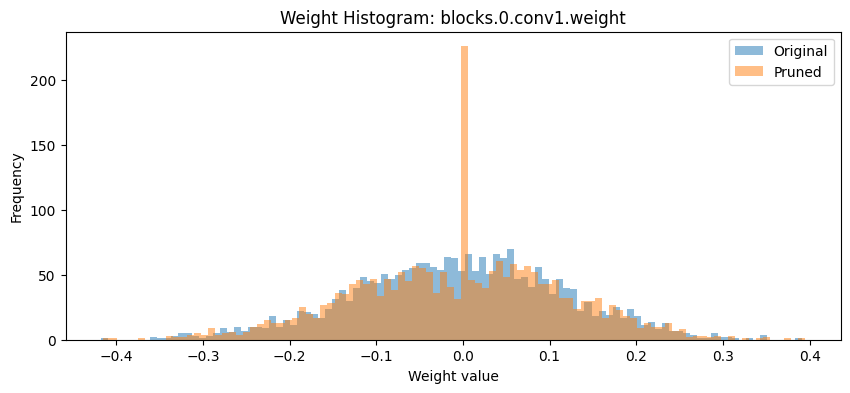

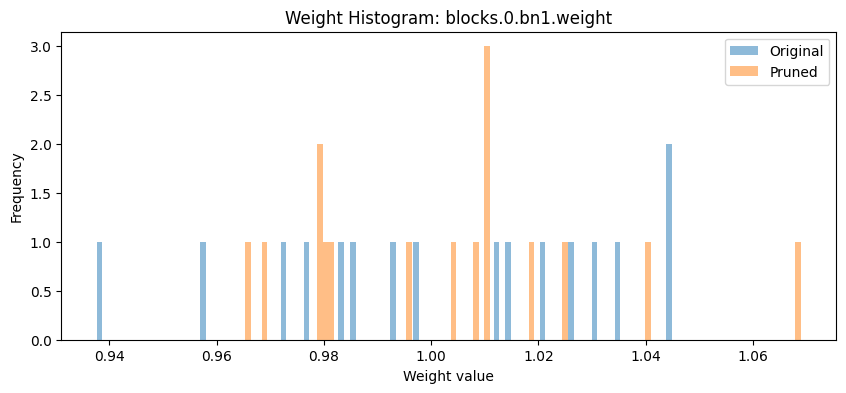

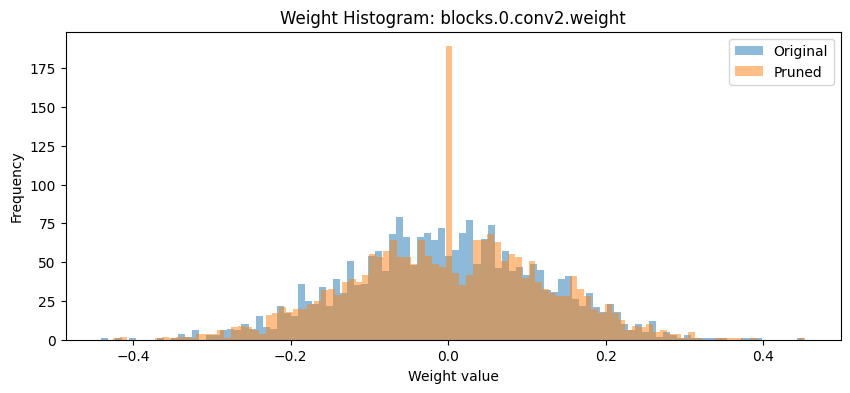

...

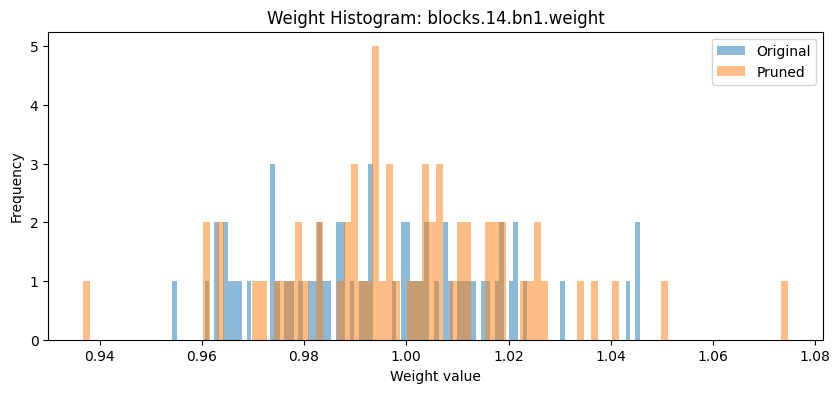

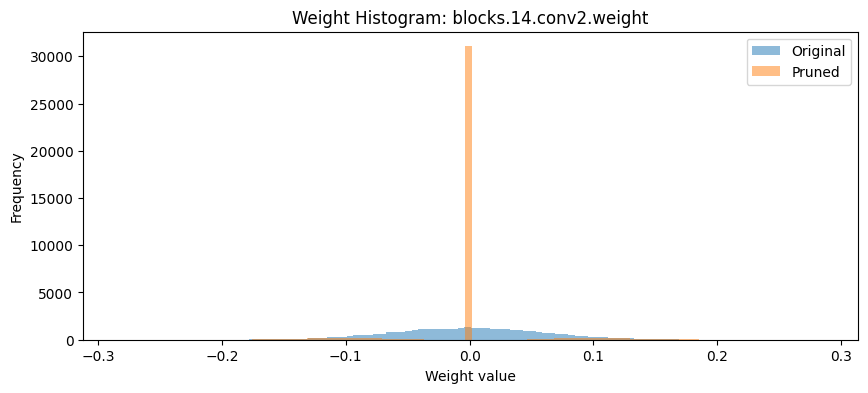

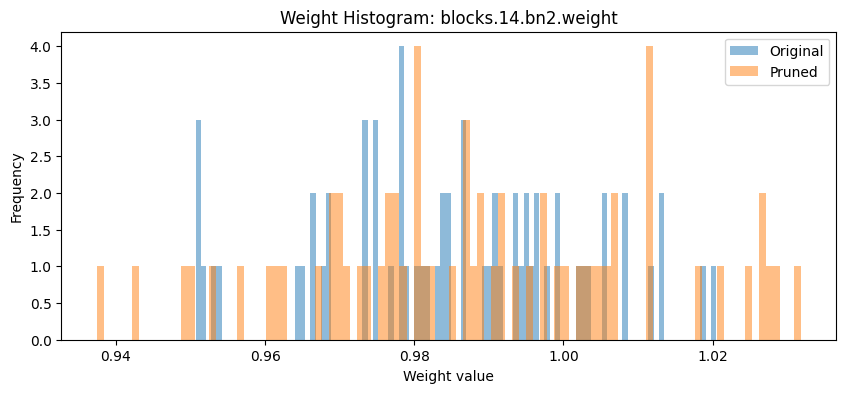

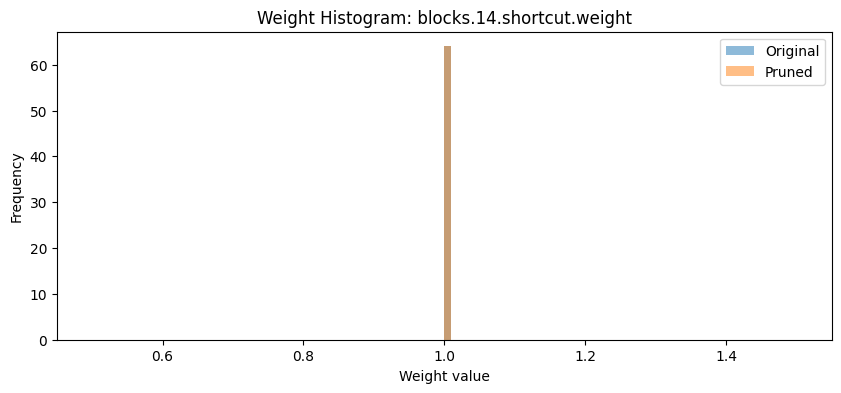

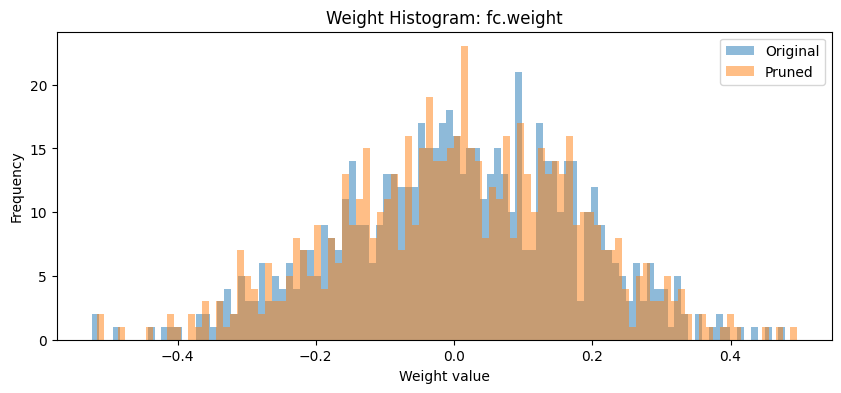

In [29]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np


# Function to plot weight histograms before and after pruning
def plot_weight_histograms(original_model, pruned_model):
    for (name1, param1), (name2, param2) in zip(original_model.named_parameters(), pruned_model.named_parameters()):
        if 'weight' in name1 and 'weight' in name2:
            plt.figure(figsize=(10, 4))
            plt.hist(param1.cpu().detach().numpy().flatten(), bins=100, alpha=0.5, label='Original')
            plt.hist(param2.cpu().detach().numpy().flatten(), bins=100, alpha=0.5, label='Pruned')
            plt.title(f'Weight Histogram: {name1}')
            plt.xlabel('Weight value')
            plt.ylabel('Frequency')
            plt.legend()
            plt.show()

# Plot weight histograms for both models
plot_weight_histograms(original_model, pruned_model)


# Average Sparsity by Layer Type

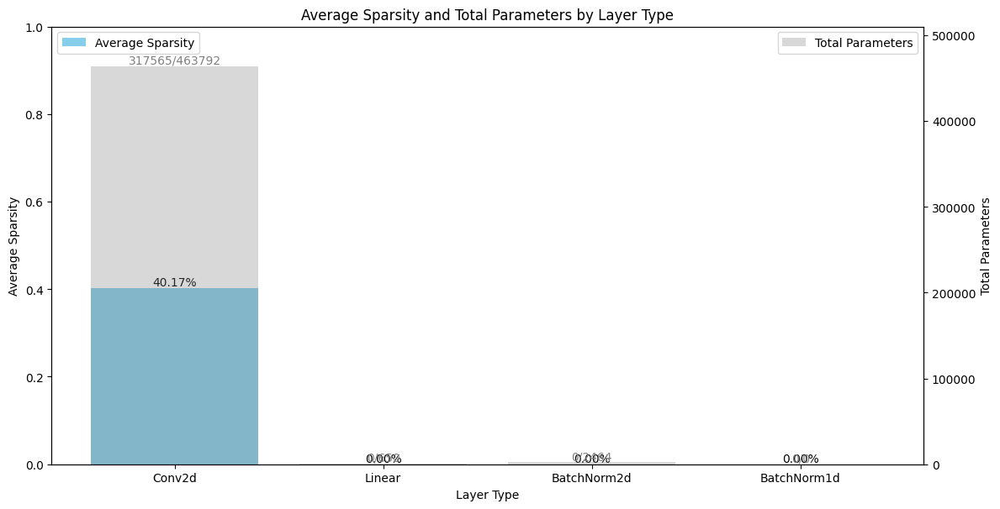

In [33]:


# Define a function to calculate the sparsity
def calculate_sparsity(model):
    sparsity_dict = {}
    total_params = 0
    sparse_params = 0
    
    for name, module in model.named_modules():
        module_total_params = 0
        module_sparse_params = 0
        has_param = False
        for pname, param in module.named_parameters(recurse=False):
            if param.requires_grad:
                param_total = param.numel()
                param_sparse = (param == 0).sum().item()
                
                module_total_params += param_total
                module_sparse_params += param_sparse
                total_params += param_total
                sparse_params += param_sparse
                has_param = True
                
        if has_param:  # Only include modules with parameters
            if module_total_params > 0:
                module_sparsity = module_sparse_params / module_total_params
            else:
                module_sparsity = 0
            sparsity_dict[name] = (module_sparsity, module_total_params, module_sparse_params)
    
    overall_sparsity = sparse_params / total_params
    return sparsity_dict, total_params, sparse_params, overall_sparsity

# Define a function to aggregate sparsity by layer type
def aggregate_sparsity(sparsity_dict, model):
    layer_sparsity = {
        'Conv2d': [],
        'Linear': [],
        'BatchNorm2d': [],
        'BatchNorm1d': []
    }
    
    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d):
            layer_sparsity['Conv2d'].append(sparsity_dict[name])
        elif isinstance(module, nn.Linear):
            layer_sparsity['Linear'].append(sparsity_dict[name])
        elif isinstance(module, nn.BatchNorm2d):
            layer_sparsity['BatchNorm2d'].append(sparsity_dict[name])
        elif isinstance(module, nn.BatchNorm1d):
            layer_sparsity['BatchNorm1d'].append(sparsity_dict[name])
    
    # Average sparsity for each layer type
    aggregated_sparsity = {}
    for layer, sparsities in layer_sparsity.items():
        if sparsities:
            avg_sparsity = np.mean([s[0] for s in sparsities])
            total_params = sum([s[1] for s in sparsities])
            sparse_params = sum([s[2] for s in sparsities])
            aggregated_sparsity[layer] = (avg_sparsity, total_params, sparse_params)
        else:
            aggregated_sparsity[layer] = (0.0, 0, 0)
    
    return aggregated_sparsity

# Define a function to plot the aggregated sparsity
def plot_aggregated_sparsity(aggregated_sparsity):
    layer_types = list(aggregated_sparsity.keys())
    sparsity_values = [s[0] for s in aggregated_sparsity.values()]
    total_params = [s[1] for s in aggregated_sparsity.values()]
    sparse_params = [s[2] for s in aggregated_sparsity.values()]
    sparse_percentages = [sparsity * 100 for sparsity in sparsity_values]
    
    fig, ax1 = plt.subplots(figsize=(12, 6))

    ax2 = ax1.twinx()
    ax1.bar(layer_types, sparsity_values, color='skyblue', label='Average Sparsity')
    ax2.bar(layer_types, total_params, alpha=0.3, color='gray', label='Total Parameters')
    
    ax1.set_xlabel('Layer Type')
    ax1.set_ylabel('Average Sparsity')
    ax2.set_ylabel('Total Parameters')

    for i, (sparsity, total, sparse, percent) in enumerate(zip(sparsity_values, total_params, sparse_params, sparse_percentages)):
        ax1.text(i, sparsity, f'{percent:.2f}%', ha='center', va='bottom')
        ax2.text(i, total, f'{sparse}/{total}', ha='center', va='bottom', color='gray')

    ax1.set_ylim(0, 1)
    ax2.set_ylim(0, max(total_params) * 1.1)

    fig.tight_layout()
    plt.title('Average Sparsity and Total Parameters by Layer Type')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.show()

# Calculate and plot sparsity
sparsity_dict, total_params, sparse_params, overall_sparsity = calculate_sparsity(pruned_model)
aggregated_sparsity = aggregate_sparsity(sparsity_dict, original_model)
plot_aggregated_sparsity(aggregated_sparsity)


# Shift in Distribution:

A noticeable shift in the distribution towards zero indicates effective pruning, where less important weights have been zeroed out.
This shift reflects a model that is more focused on significant features and has reduced computational overhead.

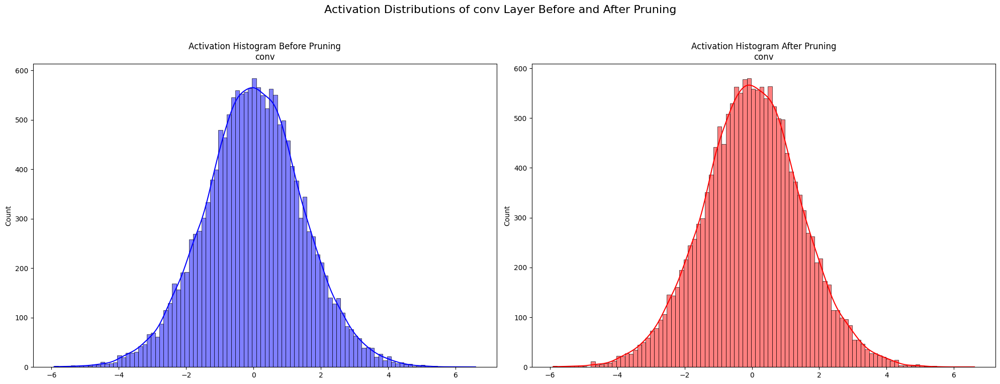

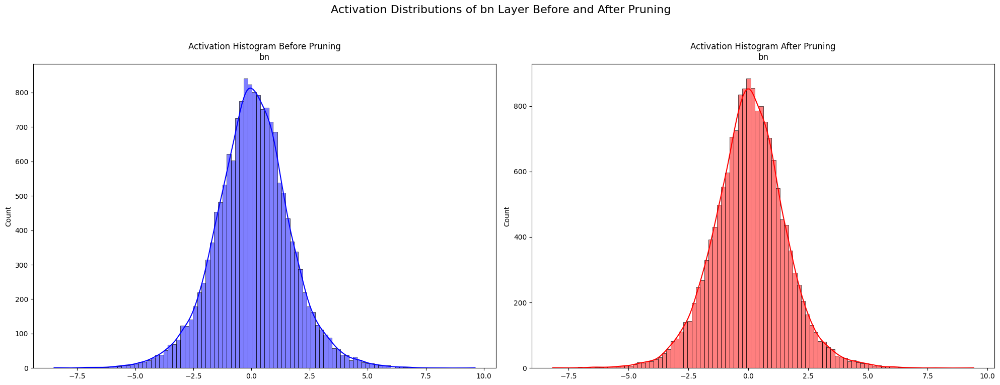

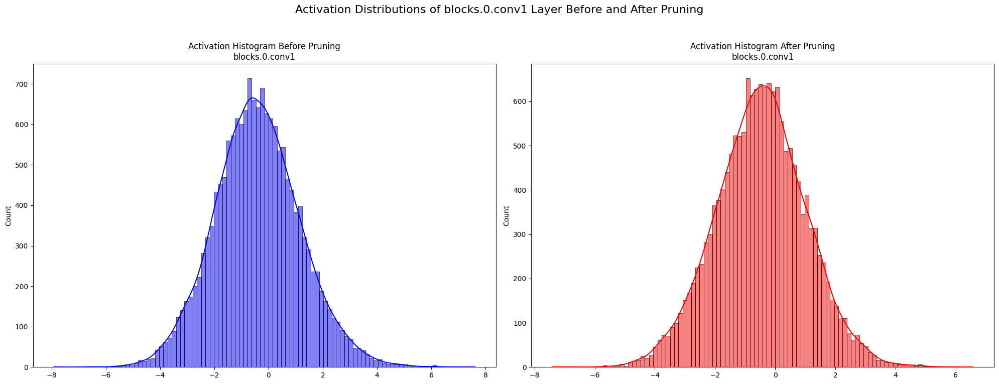

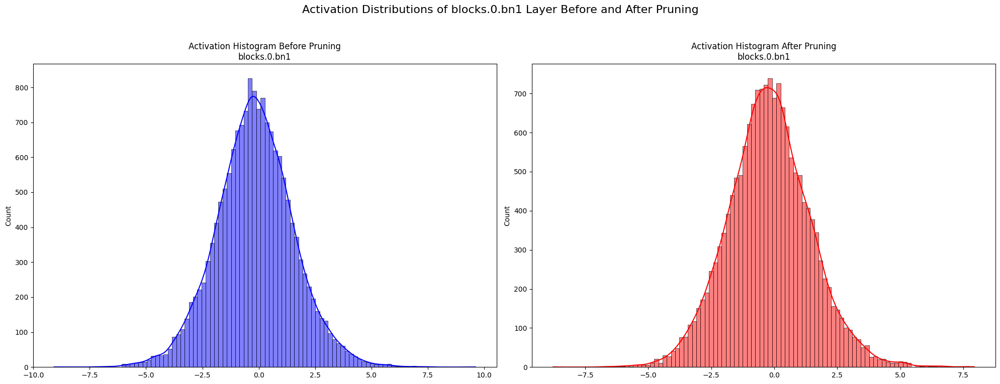

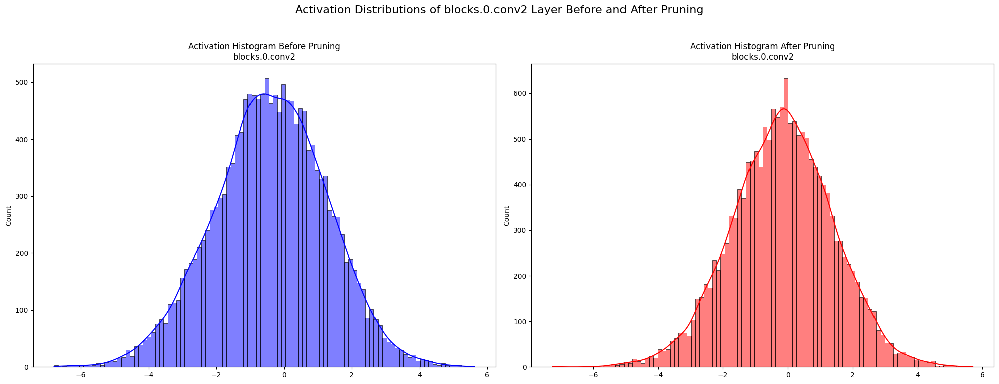

...

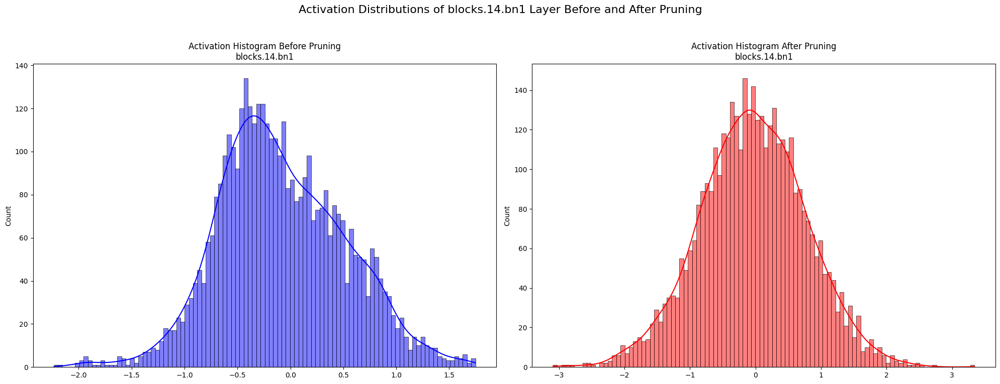

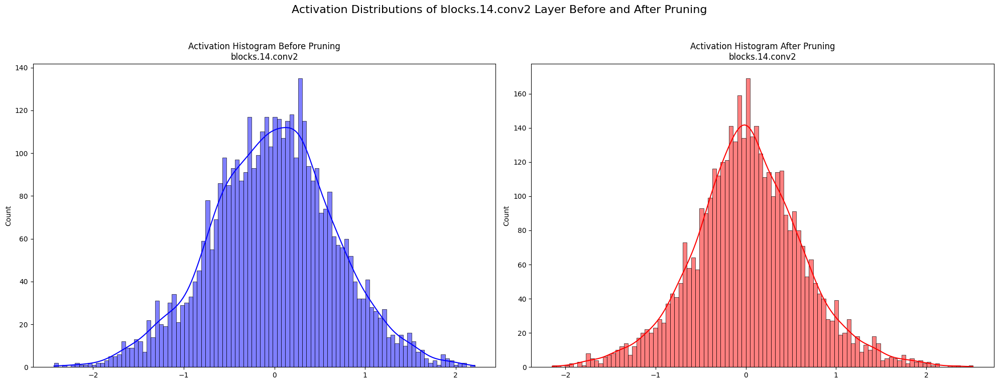

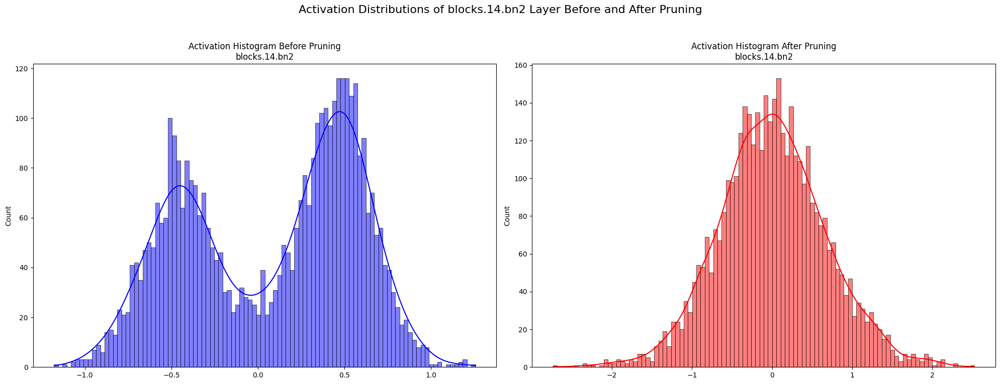

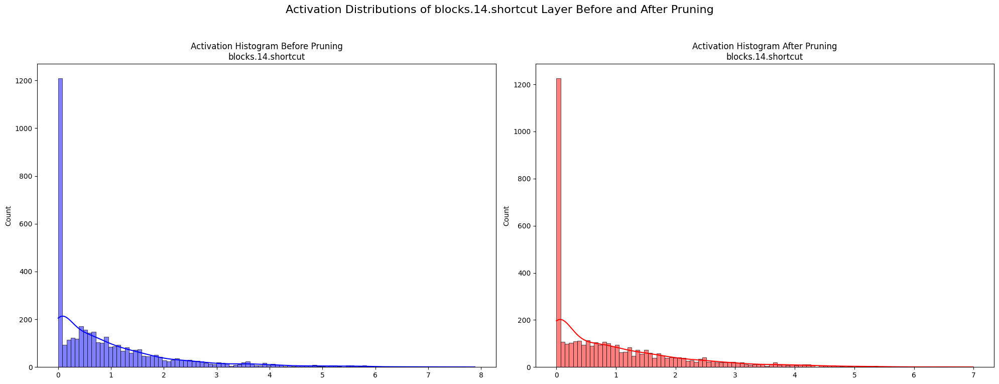

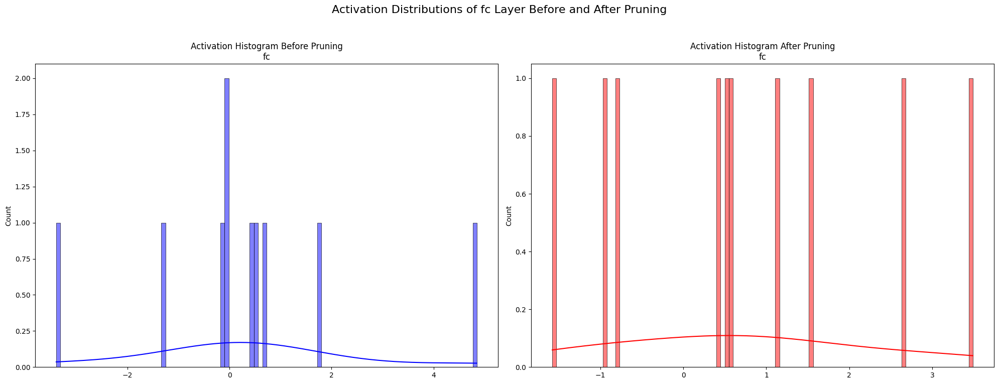

In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define a function to extract feature maps from a specified layer
def get_feature_maps(model, input_tensor, target_layer_name):
    feature_maps = {}
    
    def hook_fn(module, input, output):
        feature_maps[target_layer_name] = output.cpu().detach().numpy()
    
    hooks = []
    for name, module in model.named_modules():
        if name == target_layer_name:
            hooks.append(module.register_forward_hook(hook_fn))
    
    model(input_tensor.to(device))
    
    for hook in hooks:
        hook.remove()
    
    return feature_maps

# Define a function to plot histograms of feature maps before and after pruning
def plot_feature_maps_histogram(before_feature_maps, after_feature_maps, layer_name):
    before_maps = before_feature_maps[layer_name].flatten()
    after_maps = after_feature_maps[layer_name].flatten()
    
    plt.figure(figsize=(20, 8))
    
    plt.subplot(1, 2, 1)
    sns.histplot(before_maps, bins=100, kde=True, color='blue')
    plt.title(f'Activation Histogram Before Pruning\n{layer_name}')
    
    plt.subplot(1, 2, 2)
    sns.histplot(after_maps, bins=100, kde=True, color='red')
    plt.title(f'Activation Histogram After Pruning\n{layer_name}')
    
    plt.suptitle(f'Activation Distributions of {layer_name} Layer Before and After Pruning', size=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Instantiate the original and pruned models (for demonstration purposes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
original_model = original_model.to(device)
pruned_model = pruned_model.to(device)

# Generate a dummy input tensor
input_tensor = torch.randn(1, 3, 32, 32)

# Iterate through all the layers in the model and plot the histograms
for name, module in original_model.named_modules():
    # Skip non-leaf modules
    if len(list(module.children())) > 0:
        continue
    
    # Extract feature maps before and after pruning
    before_feature_maps = get_feature_maps(original_model, input_tensor, name)
    after_feature_maps = get_feature_maps(pruned_model, input_tensor, name)
    
    # Plot histograms for the current layer
    plot_feature_maps_histogram(before_feature_maps, after_feature_maps, layer_name=name)
